# **Load Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
zip_dir = '/content/drive/MyDrive/Cellula Technology/Teeth Classification/Dataset/Teeth DataSet.zip'
zip_ref = zipfile.ZipFile(zip_dir, 'r')
zip_ref.extractall('/content/drive/MyDrive/Cellula Technology/Teeth Classification/Dataset/Extracted Dataset')
zip_ref.close()

# **Data Preprocessing**

In [ ]:
import zipfile
import os
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
main_dir = '/content/drive/MyDrive/Cellula Technology/Teeth Classification/Dataset/Extracted Dataset/Teeth_Dataset'

train_dir = os.path.join(main_dir, 'Training')
val_dir = os.path.join(main_dir, 'Validation')
test_dir = os.path.join(main_dir, 'Testing')

In [ ]:
def count_images_in_directory(directory):
  """Counts the total number of files in a directory, including subdirectories."""
  total_images = 0
  for dirpath, dirnames, filenames in os.walk(directory):
    total_images += len(filenames)
  return total_images

train_image_count = count_images_in_directory(train_dir)
val_image_count = count_images_in_directory(val_dir)
test_image_count = count_images_in_directory(test_dir)

print(f"Total images in training set: {train_image_count}")
print(f"Total images in validation set: {val_image_count}")
print(f"Total images in test set: {test_image_count}")

Total images in training set: 3087
Total images in validation set: 1028
Total images in test set: 1028


In [ ]:
os.listdir(main_dir)

['Testing', 'Validation', 'Training']

In [ ]:
print(os.listdir(train_dir))
print(os.listdir(val_dir))
print(os.listdir(test_dir))

['OT', 'CoS', 'MC', 'CaS', 'OC', 'OLP', 'Gum']
['Gum', 'OC', 'CoS', 'CaS', 'OT', 'OLP', 'MC']
['OC', 'Gum', 'CoS', 'OT', 'CaS', 'MC', 'OLP']


In [ ]:
image_height = 256
image_width = 256
batch_size = 32

train_data = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(image_height, image_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=True
)

val_data = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(image_height, image_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=False
)

test_data = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='categorical',
    image_size=(image_height, image_width),
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=False
)

Found 3087 files belonging to 7 classes.
Found 1028 files belonging to 7 classes.
Found 1028 files belonging to 7 classes.


# **Data Visualisation**

In [ ]:
def image_viz(dataset):
  plt.figure(figsize=(12, 8))
  class_names = dataset.class_names
  num_classes = len(class_names)
  images_to_show = {}

  # Iterate through the dataset to find one image for each class
  for image_batch, label_batch in dataset:
    for i in range(len(image_batch)):
      predicted_class_index = tf.argmax(label_batch[i]).numpy()
      class_name = class_names[predicted_class_index]

      if class_name not in images_to_show:
        images_to_show[class_name] = image_batch[i].numpy().astype("uint8")

      if len(images_to_show) == num_classes:
        break
    if len(images_to_show) == num_classes:
      break

  # Display the collected images
  index = 0
  for class_name, image in images_to_show.items():
    ax = plt.subplot(3, 4, index + 1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis("off")
    index += 1

  plt.tight_layout()
  plt.show()

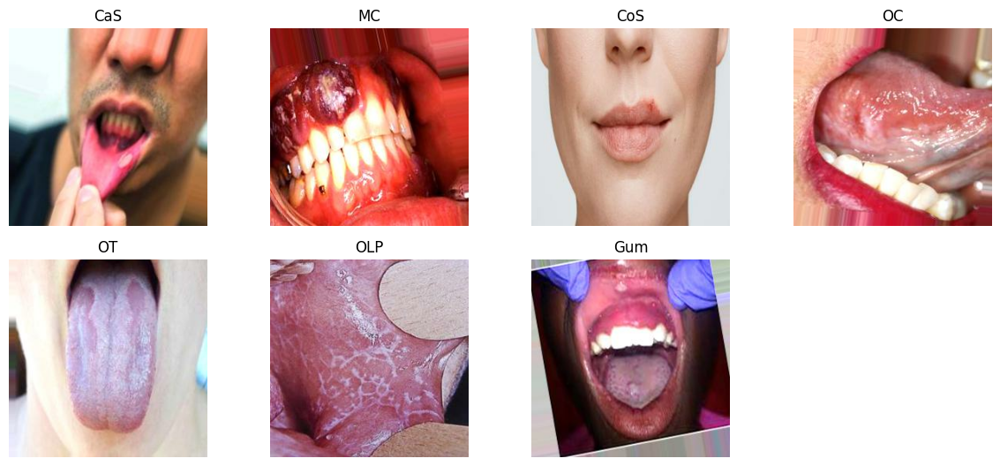

In [ ]:
image_viz(train_data)


# **Creating, Compiling, and Training a Model**

## **BEFORE DATA AUGMMENTATION**

In [ ]:
input_shape = [256, 256, 3]

teeth_cnn_1 = tf.keras.models.Sequential([
    # Input layer
    tf.keras.layers.Input(shape=input_shape),

    # Rescaling layer for normalization
    tf.keras.layers.Rescaling(1./255),


    # First Block
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    # Second Block
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    # Third Block
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),


    tf.keras.layers.Flatten(),

    # Fully Connected layers
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    tf.keras.layers.Dense(units=7, activation='softmax')
])

In [ ]:
# Model summary

teeth_cnn_1.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_7 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │    16,777,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,871,495 (64.36 MB)

 Trainable params: 16,871,495 (64.36 MB)

 Non-trainable params: 0 (0.00 B)

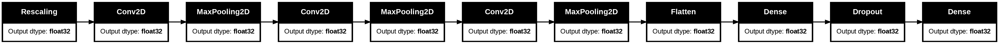

In [ ]:
tf.keras.utils.plot_model(teeth_cnn_1, rankdir='LR',show_dtype=True)

In [ ]:
teeth_cnn_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Stop training when validation loss stops improving
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=10,
                               restore_best_weights=True)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=3,
                              min_lr=1e-6)

# Train the model
history_1 = teeth_cnn_1.fit(train_data,
                        validation_data=val_data,
                        epochs=50,
                        callbacks=[early_stopping, reduce_lr])

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 176ms/step - accuracy: 0.2083 - loss: 2.2605 - val_accuracy: 0.2782 - val_loss: 1.8048 - learning_rate: 0.0010
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - accuracy: 0.3043 - loss: 1.7666 - val_accuracy: 0.4368 - val_loss: 1.5650 - learning_rate: 0.0010
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - accuracy: 0.3985 - loss: 1.6003 - val_accuracy: 0.4611 - val_loss: 1.4379 - learning_rate: 0.0010
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - accuracy: 0.4402 - loss: 1.4331 - val_accuracy: 0.4737 - val_loss: 1.3795 - learning_rate: 0.0010
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - accuracy: 0.4984 - loss: 1.3423 - val_accuracy: 0.5321 - val_loss: 1.3479 - learning_rate: 0.0010
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - accuracy: 0.5727 - loss: 1.1190 - val_accuracy: 0.5535 - val_loss: 1.2497 - learning_rate: 0.0010
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - accuracy: 0.6251 - loss: 1.

In [ ]:
# function to plot accuracy and loss

def plot_acc_loss(acc, val_acc, loss, val_loss, epochs):

  plt.figure(figsize=(10,5))
  plt.plot(epochs, acc, 'r', label='Training Accuracy')
  plt.plot(epochs, val_acc, 'g', label='Validation Accuracy')
  plt.title('Training and validation accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend(loc=0)

  # Create a new figure with plt.figure()
  plt.figure()

  plt.figure(figsize=(10,5))
  plt.plot(epochs, loss, 'b', label='Training Loss')
  plt.plot(epochs, val_loss, 'y', label='Validation Loss')
  plt.title('Training and Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend(loc=0)
  plt.show()

In [ ]:
model_history = history_1.history

acc = model_history['accuracy']
val_acc = model_history['val_accuracy']
loss = model_history['loss']
val_loss = model_history['val_loss']

epochs = history_1.epoch

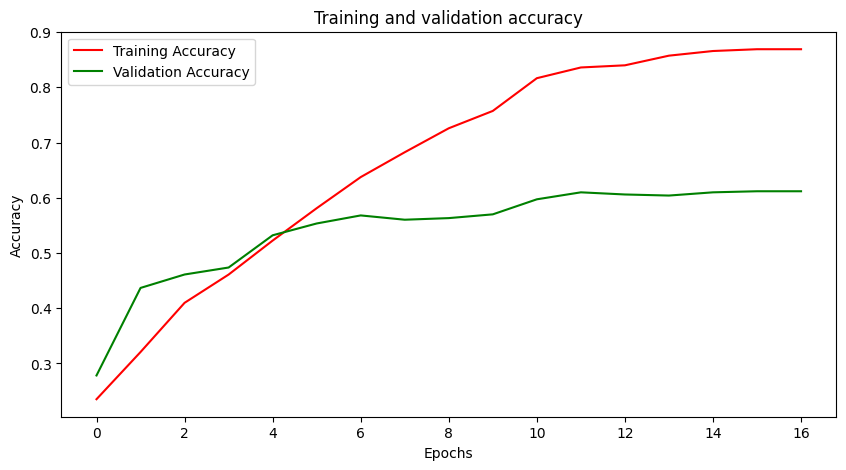

<Figure size 640x480 with 0 Axes>

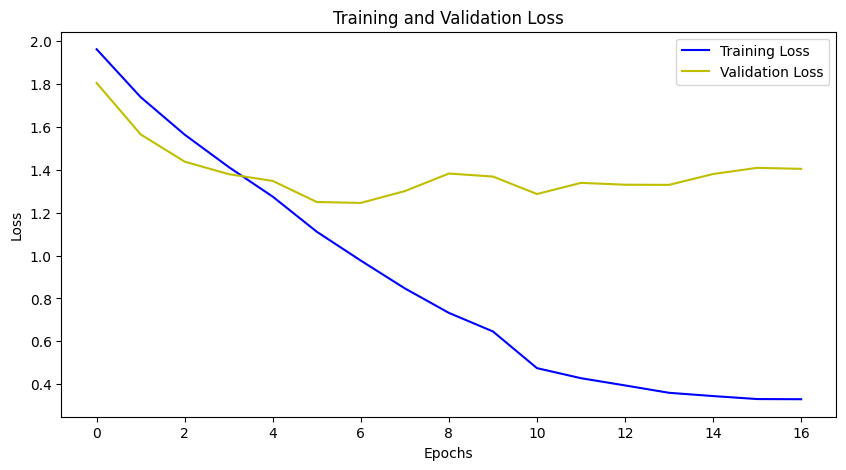

In [ ]:
plot_acc_loss(acc, val_acc, loss, val_loss, epochs)


In [ ]:
print("Evaluating model on the test dataset...")
test_loss, test_accuracy = teeth_cnn_1.evaluate(test_data)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

Evaluating model on the test dataset...
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - accuracy: 0.5535 - loss: 1.1999
Test Loss: 1.3454
Test Accuracy: 55.06%


33/33 ━━━━━━━━━━━━━━━━━━━━ 7s 210ms/step
Classification Report:
              precision    recall  f1-score   support

         CaS       0.44      0.44      0.44       160
         CoS       0.58      0.87      0.69       149
         Gum       0.67      0.63      0.65       120
          MC       0.52      0.45      0.48       180
          OC       0.50      0.45      0.48       108
         OLP       0.58      0.59      0.58       180
          OT       0.58      0.42      0.49       131

    accuracy                           0.55      1028
   macro avg       0.55      0.55      0.54      1028
weighted avg       0.55      0.55      0.54      1028


Confusion Matrix:
[[ 70  53   2  10  10  11   4]
 [ 14 129   0   3   0   1   2]
 [ 12  10  76   5   4  11   2]
 [ 25  12  14  81  18  18  12]
 [  7   2   3  16  49  24   7]
 [ 20   4  12  17   8 106  13]
 [ 11  14   7  23   9  12  55]]


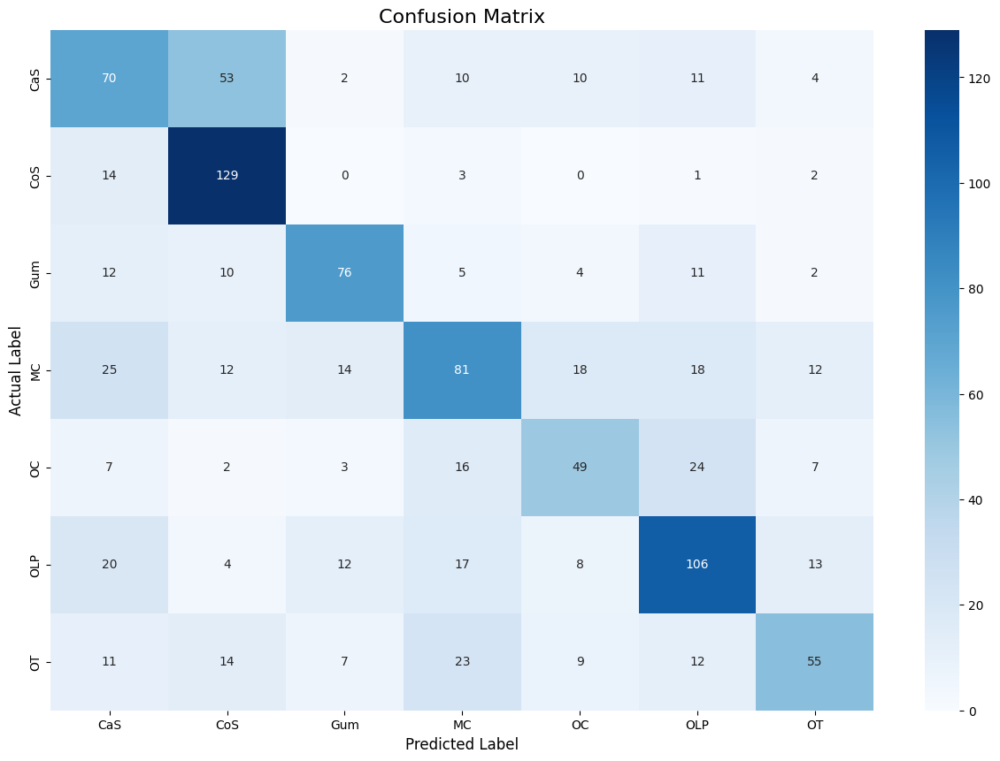

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Get the ground truth labels from the test dataset
true_labels = []
for images, labels in test_data:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(true_labels)

# Get the model's predictions on the test dataset
predictions = teeth_cnn_1.predict(test_data)
y_pred = np.argmax(predictions, axis=1)

# Get the class names
class_names = test_data.class_names

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
print(cm)

# Confusion Matrix Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

In [ ]:
def visualize_predictions(model, dataset, class_names, num_images=16):
    """
    Displays a grid of images from a dataset with their actual and predicted labels.
    """
    plt.figure(figsize=(15, 15))

    # Take one batch from the dataset
    for image_batch, label_batch in dataset.take(1):
        # Make predictions on the batch
        predictions = model.predict(image_batch)
        predicted_indices = np.argmax(predictions, axis=1)
        actual_indices = np.argmax(label_batch.numpy(), axis=1)

        # Calculate grid size
        grid_size = int(np.ceil(np.sqrt(num_images)))

        # Plot the images
        for i in range(num_images):
            ax = plt.subplot(grid_size, grid_size, i + 1)
            plt.imshow(image_batch[i].numpy().astype("uint8"))

            actual_label = class_names[actual_indices[i]]
            predicted_label = class_names[predicted_indices[i]]

            # Set the title color to green for correct predictions, red for incorrect
            color = "green" if actual_label == predicted_label else "red"

            plt.title(f"Actual: {actual_label}\nPredicted: {predicted_label}", color=color, fontsize=12)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


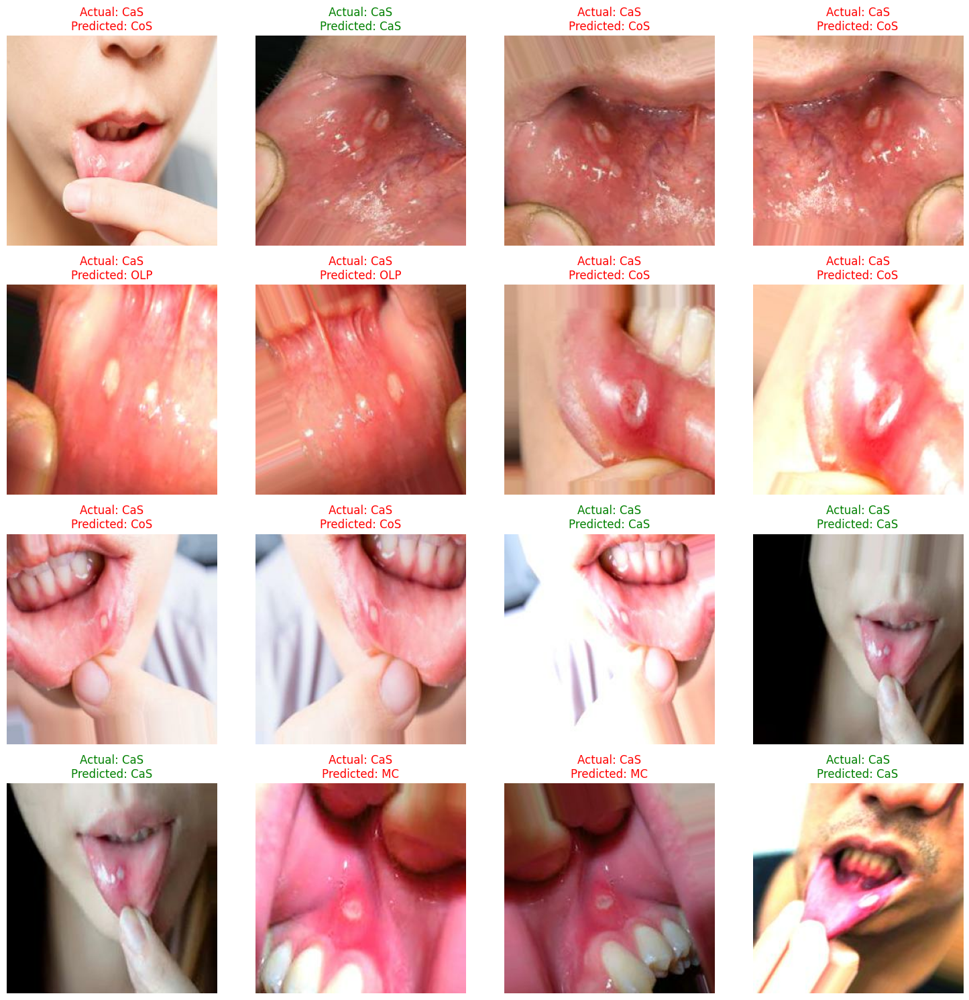

In [ ]:
# Get the class names from one of the datasets (they are all the same)
class_names = train_data.class_names

# Call the function to visualize predictions on the test set
visualize_predictions(teeth_cnn_1, test_data, class_names, num_images=16)

## **WITH DATA AUGMENTATION**

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

In [ ]:
input_shape = [256, 256, 3]

teeth_cnn_2 = tf.keras.models.Sequential([
    # Input layer
    tf.keras.layers.Input(shape=input_shape),

    # Rescaling layer for normalization
    tf.keras.layers.Rescaling(1./255),

    # Add the data augmentation layers
    data_augmentation,

    # First Block
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    # Second Block
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    # Third Block
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=2),

    tf.keras.layers.Flatten(),

    # Fully Connected layers
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    tf.keras.layers.Dense(units=7, activation='softmax')
])

In [ ]:
teeth_cnn_2.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_9 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_12 (Sequential)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │    16,777,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,871,495 (64.36 MB)

 Trainable params: 16,871,495 (64.36 MB)

 Non-trainable params: 0 (0.00 B)

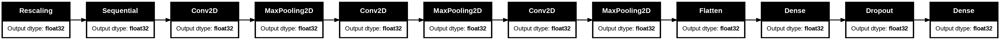

In [ ]:
tf.keras.utils.plot_model(teeth_cnn_2, rankdir='LR', show_dtype=True)

In [ ]:
teeth_cnn_2.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Stop training when validation loss stops improving
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=10,
                               restore_best_weights=True)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=3,
                              min_lr=1e-6)

# %%
# Train the model
history_2 = teeth_cnn_2.fit(train_data,
                        validation_data=val_data,
                        epochs=100,
                        callbacks=[early_stopping, reduce_lr])

Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 169ms/step - accuracy: 0.1786 - loss: 2.2561 - val_accuracy: 0.2597 - val_loss: 1.8339 - learning_rate: 0.0010
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - accuracy: 0.2394 - loss: 1.8523 - val_accuracy: 0.3259 - val_loss: 1.7423 - learning_rate: 0.0010
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - accuracy: 0.2919 - loss: 1.7938 - val_accuracy: 0.3414 - val_loss: 1.6962 - learning_rate: 0.0010
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - accuracy: 0.3139 - loss: 1.7392 - val_accuracy: 0.4037 - val_loss: 1.6037 - learning_rate: 0.0010
Epoch 5/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - accuracy: 0.3452 - loss: 1.6789 - val_accuracy: 0.4193 - val_loss: 1.5274 - learning_rate: 0.0010
Epoch 6/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - accuracy: 0.3491 - loss: 1.6389 - val_accuracy: 0.4193 - val_loss: 1.5220 - learning_rate: 0.0010
Epoch 7/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - accuracy: 0.3817 - l

In [ ]:
model_history = history_2.history

acc = model_history['accuracy']
val_acc = model_history['val_accuracy']
loss = model_history['loss']
val_loss = model_history['val_loss']

epochs = history_2.epoch

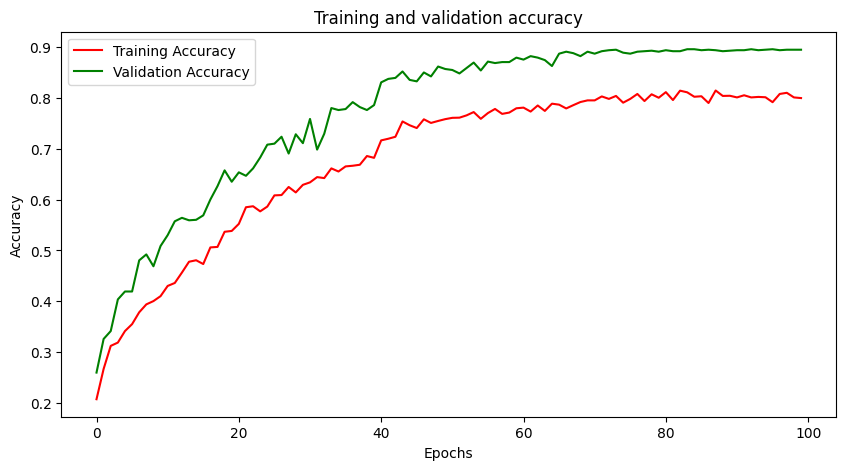

<Figure size 640x480 with 0 Axes>

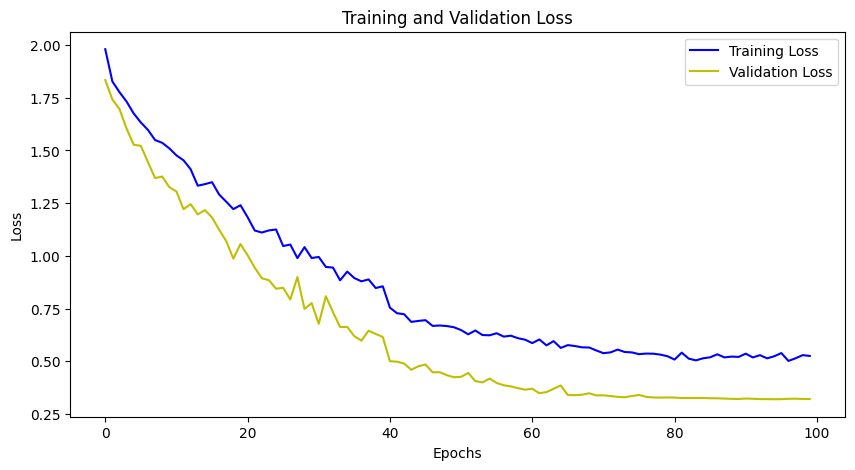

In [ ]:
plot_acc_loss(acc, val_acc, loss, val_loss, epochs)


In [ ]:
print("Evaluating model on the test dataset...")
test_loss, test_accuracy = teeth_cnn_2.evaluate(test_data)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

Evaluating model on the test dataset...
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - accuracy: 0.9035 - loss: 0.3218
Test Loss: 0.3489
Test Accuracy: 88.62%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


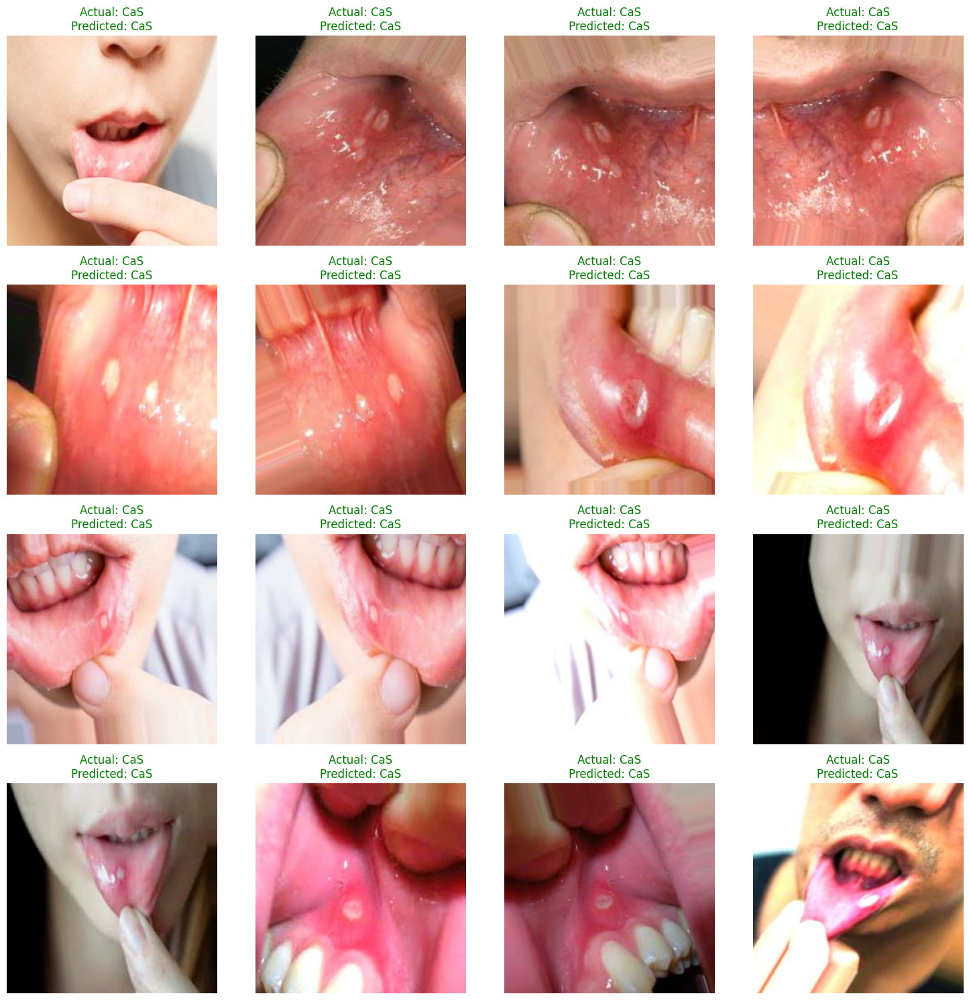

In [ ]:
# Get the class names from one of the datasets (they are all the same)
class_names = train_data.class_names

# Call the function to visualize predictions on the test set
visualize_predictions(teeth_cnn_2, test_data, class_names, num_images=16)

33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 122ms/step
Classification Report:
              precision    recall  f1-score   support

         CaS       0.91      0.93      0.92       160
         CoS       0.95      0.91      0.93       149
         Gum       0.91      0.88      0.90       120
          MC       0.85      0.84      0.84       180
          OC       0.80      0.92      0.85       108
         OLP       0.87      0.82      0.85       180
          OT       0.92      0.94      0.93       131

    accuracy                           0.89      1028
   macro avg       0.89      0.89      0.89      1028
weighted avg       0.89      0.89      0.89      1028


Confusion Matrix:
[[148   4   0   1   4   2   1]
 [  7 136   2   1   2   0   1]
 [  4   1 106   5   0   2   2]
 [  1   2   3 151   9  11   3]
 [  1   0   0   3  99   4   1]
 [  2   0   5  12  10 148   3]
 [  0   0   0   5   0   3 123]]


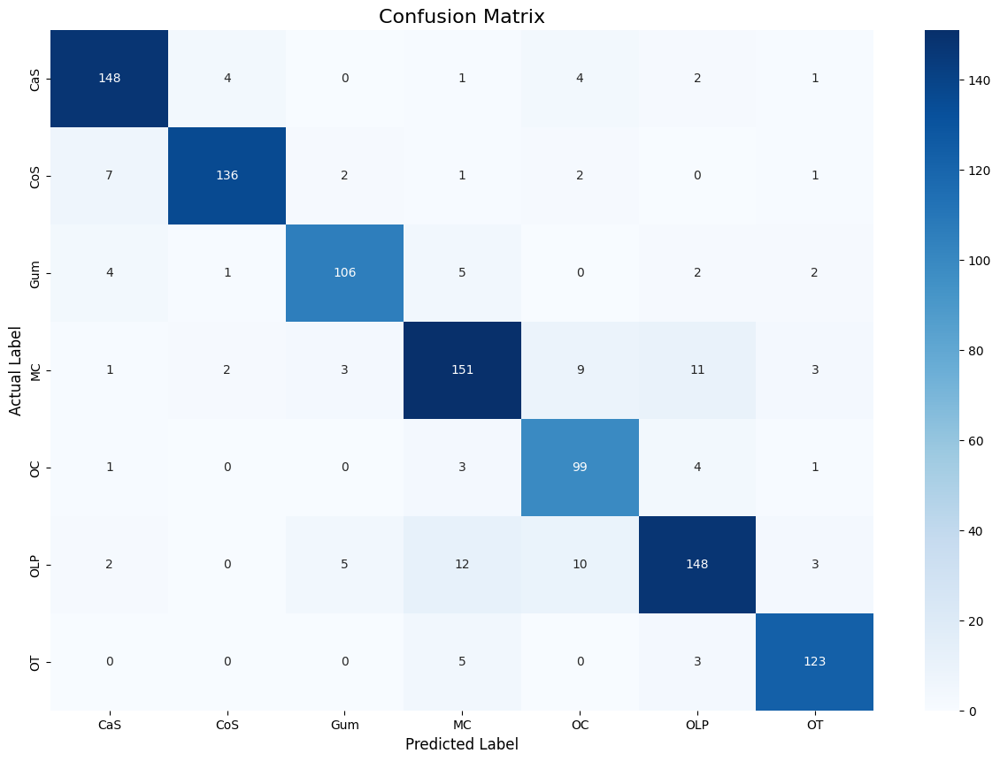

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the ground truth labels from the test dataset
true_labels = []
for images, labels in test_data:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(true_labels)

# Get the model's predictions on the test dataset
predictions = teeth_cnn_2.predict(test_data)
y_pred = np.argmax(predictions, axis=1)

# Get the class names
class_names = test_data.class_names

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
print(cm)

# Confusion Matrix Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

In [ ]:
# Specify the path to save the model in your Google Drive
model_save_path = '/content/drive/MyDrive/Cellula Technology/Teeth Classification/teeth_classification_model_with_augmentation.keras'

# Save the model
teeth_cnn_2.save(model_save_path)

print(f"Model saved to: {model_save_path}")

Model saved to: /content/drive/MyDrive/Cellula Technology/Teeth Classification/teeth_classification_model_with_augmentation.keras


# **Transfer Learning**

## **Xception**

In [ ]:
pretrained_base_model = keras.applications.Xception(
    weights='imagenet',
    include_top=False, # Drop imagenet classifier on the top
    input_shape=(256, 256, 3) # Updated input shape to match the input tensor

)

In [ ]:
for layer in pretrained_base_model.layers:
  layer.trainable = False

In [ ]:
pretrained_base_model.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 127, 127,  │        864 │ input_layer_3[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 127, 127,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 127, 127,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 125, 125,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 125, 125,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 125, 125,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 125, 125,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 125, 125,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 125, 125,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 125, 125,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 125, 125,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 63, 63,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 63, 63,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 63, 63,    │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 63, 63,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 63, 63,    │          0 │ add_12[0][0]    

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
input_shape = [256, 256, 3]

teeth_Tranfer_1 = tf.keras.models.Sequential([
    # Input layer
    tf.keras.layers.Input(shape=input_shape),

    # Rescaling layer for normalization
    tf.keras.layers.Rescaling(1./255),

    # Add the data augmentation layers
    data_augmentation,

    pretrained_base_model,
    tf.keras.layers.GlobalAveragePooling2D(),

    tf.keras.layers.Dropout(0.5),

    tf.keras.layers.Dense(units=7, activation='softmax')
])

In [ ]:
teeth_Tranfer_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Stop training when validation loss stops improving
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=10,
                               restore_best_weights=True)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=3,
                              min_lr=1e-6)

# Train the model
history_3 = teeth_Tranfer_1.fit(train_data,
                        validation_data=val_data,
                        epochs=100,
                        callbacks=[early_stopping, reduce_lr])

Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 70s 636ms/step - accuracy: 0.2978 - loss: 1.7737 - val_accuracy: 0.5788 - val_loss: 1.2380 - learning_rate: 0.0010
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 45s 293ms/step - accuracy: 0.5044 - loss: 1.3265 - val_accuracy: 0.6235 - val_loss: 1.0931 - learning_rate: 0.0010
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 29s 296ms/step - accuracy: 0.5824 - loss: 1.1599 - val_accuracy: 0.6537 - val_loss: 1.0032 - learning_rate: 0.0010
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 29s 299ms/step - accuracy: 0.5959 - loss: 1.0896 - val_accuracy: 0.6848 - val_loss: 0.9515 - learning_rate: 0.0010
Epoch 5/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 29s 302ms/step - accuracy: 0.6223 - loss: 1.0438 - val_accuracy: 0.7072 - val_loss: 0.9059 - learning_rate: 0.0010
Epoch 6/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - accuracy: 0.6343 - loss: 0.9804 - val_accuracy: 0.7315 - val_loss: 0.8709 - learning_rate: 0.0010
Epoch 7/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 45s 303ms/step - accuracy: 0.6400 - l

In [ ]:
model_history = history_3.history

acc = model_history['accuracy']
val_acc = model_history['val_accuracy']
loss = model_history['loss']
val_loss = model_history['val_loss']

epochs = history_3.epoch

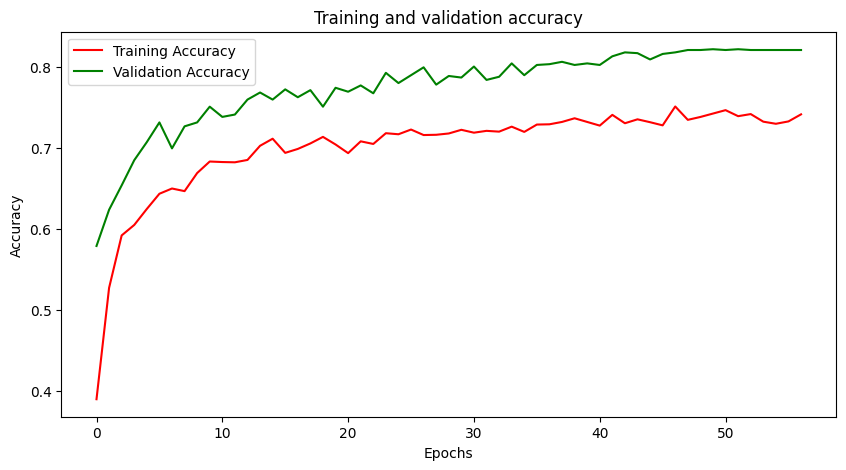

<Figure size 640x480 with 0 Axes>

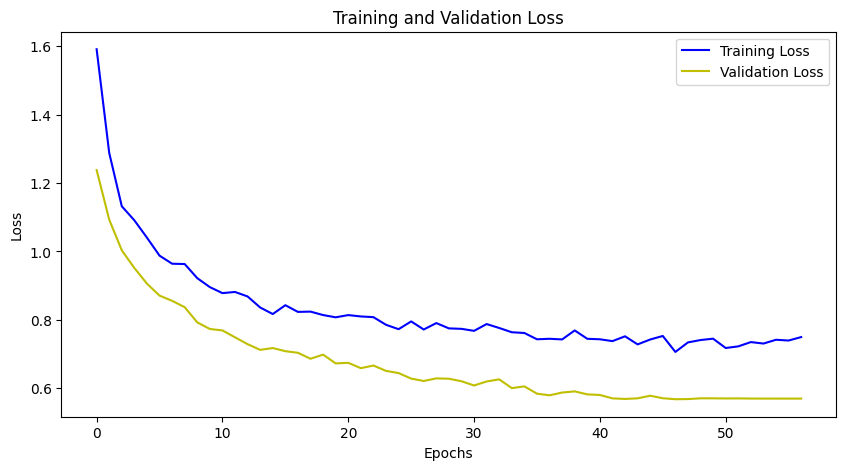

In [ ]:
plot_acc_loss(acc, val_acc, loss, val_loss, epochs)

In [ ]:
print("Evaluating model on the test dataset...")
test_loss, test_accuracy = teeth_Tranfer_1.evaluate(test_data)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

Evaluating model on the test dataset...
33/33 ━━━━━━━━━━━━━━━━━━━━ 194s 6s/step - accuracy: 0.8695 - loss: 0.4271
Test Loss: 0.5640
Test Accuracy: 81.61%


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


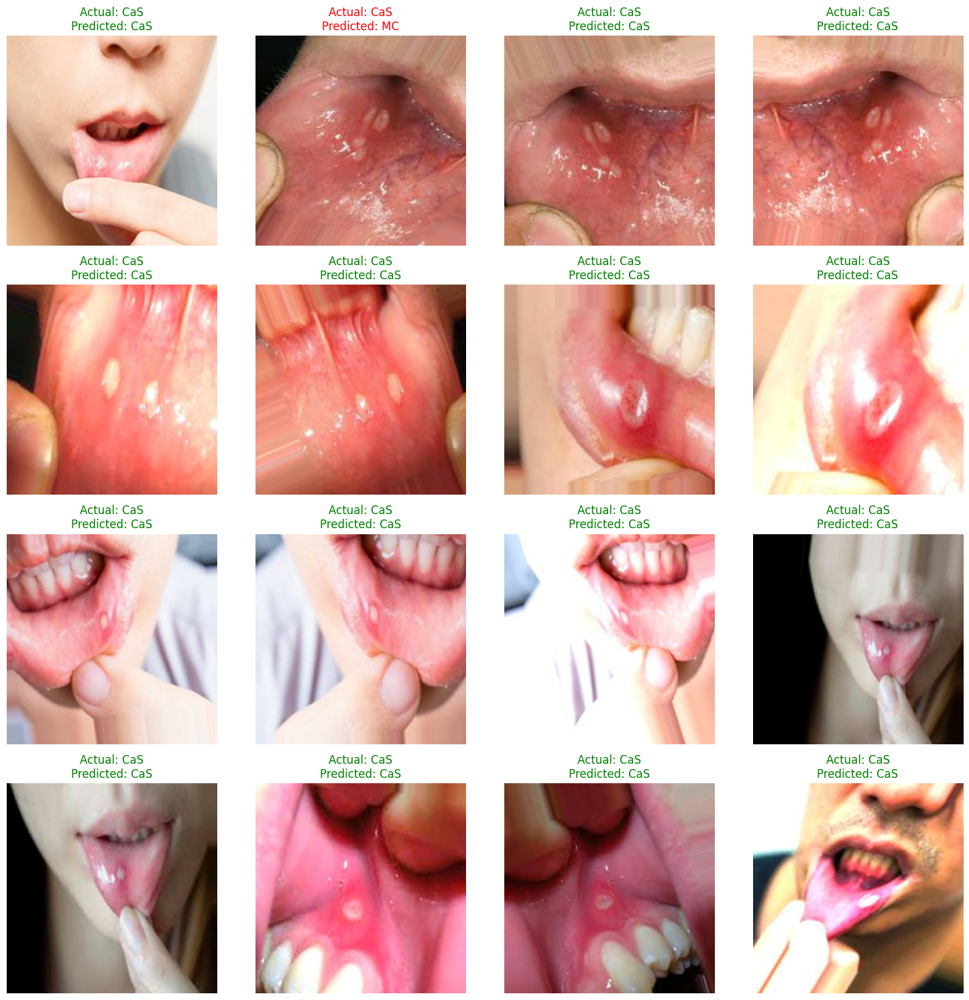

In [ ]:
# Get the class names from one of the datasets (they are all the same)
class_names = train_data.class_names

# Call the function to visualize predictions on the test set
visualize_predictions(teeth_Tranfer_1, test_data, class_names, num_images=16)

33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 210ms/step
Classification Report:
              precision    recall  f1-score   support

         CaS       0.84      0.89      0.86       160
         CoS       0.85      0.95      0.90       149
         Gum       0.83      0.83      0.83       120
          MC       0.77      0.76      0.77       180
          OC       0.80      0.76      0.78       108
         OLP       0.83      0.72      0.77       180
          OT       0.78      0.81      0.79       131

    accuracy                           0.82      1028
   macro avg       0.82      0.82      0.82      1028
weighted avg       0.82      0.82      0.81      1028


Confusion Matrix:
[[142   8   1   4   1   2   2]
 [  2 142   0   4   0   1   0]
 [  7   4 100   5   0   0   4]
 [  5   3  17 137   6   8   4]
 [  1   1   0  11  82   9   4]
 [  9   2   2  10  11 130  16]
 [  3   8   0   6   2   6 106]]


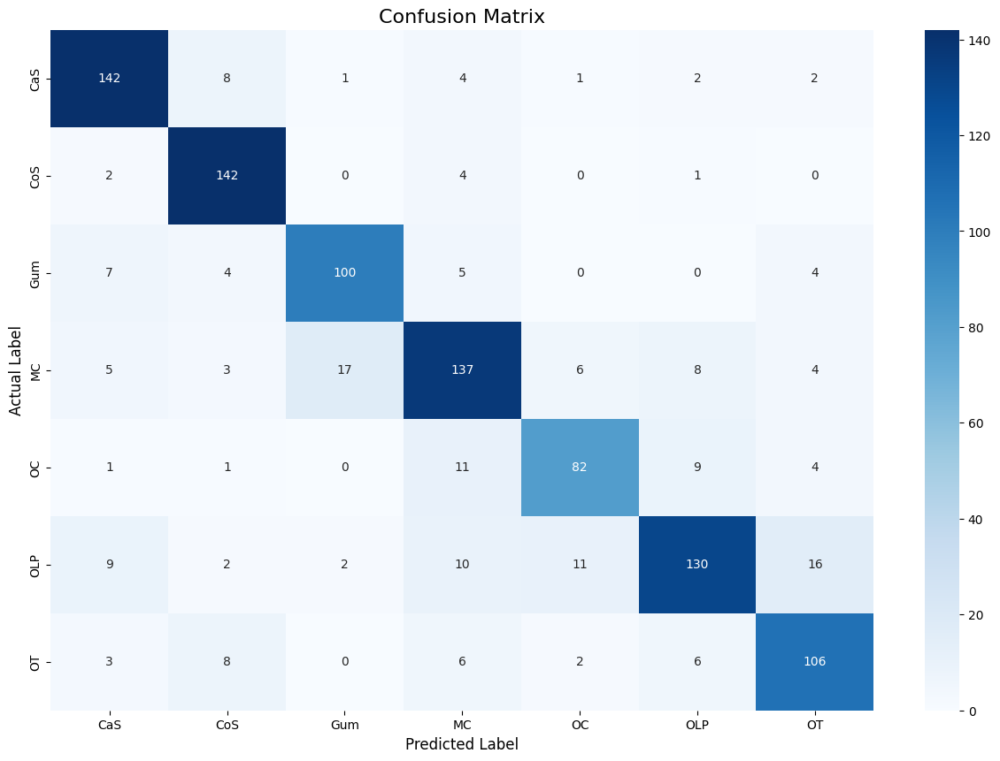

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the ground truth labels from the test dataset
true_labels = []
for images, labels in test_data:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(true_labels)

# Get the model's predictions on the test dataset
predictions = teeth_Tranfer_1.predict(test_data)
y_pred = np.argmax(predictions, axis=1)

# Get the class names
class_names = test_data.class_names

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
print(cm)

# Confusion Matrix Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

## **ResNet50**

In [ ]:
from tensorflow.keras.applications import ResNet50
import tensorflow as tf

# Load the ResNet50 model with pre-trained ImageNet weights, excluding the top classification layer
# Ensure the input shape matches your dataset images
resnet_base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
)

# Freeze the layers of the pre-trained base model
for layer in resnet_base_model.layers:
    layer.trainable = False

# Define the input layer for the new model
inputs = tf.keras.Input(shape=(256, 256, 3))

# Add the data augmentation layers (if you want to use them with this model)
# If you are not using data augmentation here, you can remove this line
x = data_augmentation(inputs)


# Pass the augmented input through the frozen pre-trained base model
x = resnet_base_model(x, training=False)

# Add a pooling layer
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Add a dropout layer
x = tf.keras.layers.Dropout(0.5)(x)

# Add the final dense output layer for classification
output = tf.keras.layers.Dense(units=7, activation='softmax')(x)

# Build the new transfer learning model
teeth_Tranfer_ResNet50 = tf.keras.Model(inputs, output)

# Compile the model
teeth_Tranfer_ResNet50.compile(optimizer='adam',
                               loss='categorical_crossentropy',
                               metrics=['accuracy'])

# Print the model summary
teeth_Tranfer_ResNet50.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 7)              │        14,343 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,602,055 (90.03 MB)

 Trainable params: 14,343 (56.03 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Stop training when validation loss stops improving
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=10,
                               restore_best_weights=True)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=3,
                              min_lr=1e-6)

# Train the model
history_4 = teeth_Tranfer_ResNet50.fit(train_data,
                        validation_data=val_data,
                        epochs=100,
                        callbacks=[early_stopping, reduce_lr])

Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 38s 292ms/step - accuracy: 0.2541 - loss: 2.2881 - val_accuracy: 0.6372 - val_loss: 1.0602 - learning_rate: 0.0010
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 32s 212ms/step - accuracy: 0.4979 - loss: 1.3952 - val_accuracy: 0.6887 - val_loss: 0.8782 - learning_rate: 0.0010
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 211ms/step - accuracy: 0.5707 - loss: 1.1438 - val_accuracy: 0.7490 - val_loss: 0.7429 - learning_rate: 0.0010
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 210ms/step - accuracy: 0.6204 - loss: 1.0475 - val_accuracy: 0.7451 - val_loss: 0.7242 - learning_rate: 0.0010
Epoch 5/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - accuracy: 0.6436 - loss: 0.9664 - val_accuracy: 0.7811 - val_loss: 0.6463 - learning_rate: 0.0010
Epoch 6/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 215ms/step - accuracy: 0.6604 - loss: 0.8993 - val_accuracy: 0.7977 - val_loss: 0.5923 - learning_rate: 0.0010
Epoch 7/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 211ms/step - accuracy: 0.6898 - l

In [ ]:
model_history = history_4.history

acc = model_history['accuracy']
val_acc = model_history['val_accuracy']
loss = model_history['loss']
val_loss = model_history['val_loss']

epochs = history_4.epoch

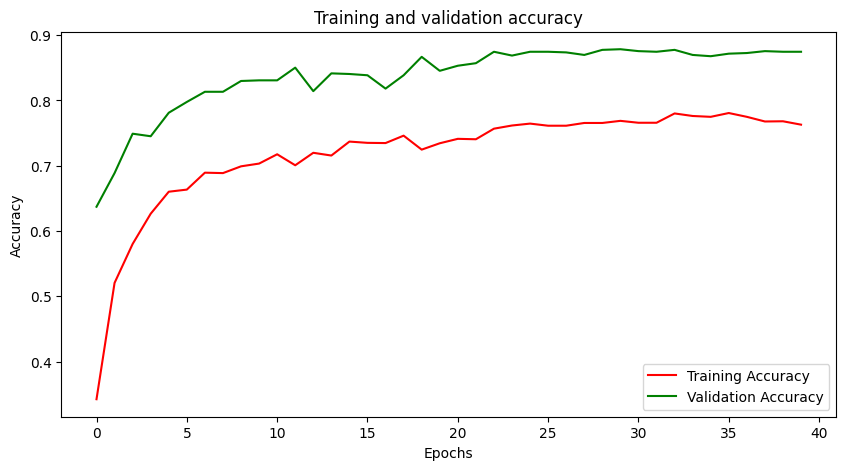

<Figure size 640x480 with 0 Axes>

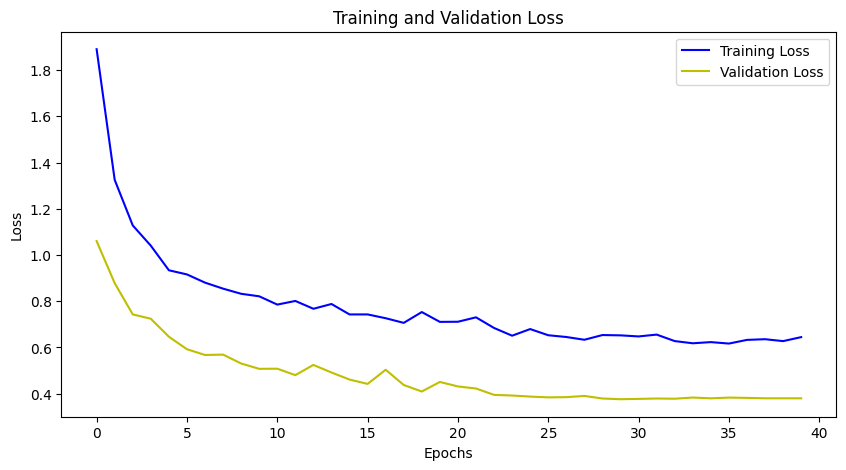

In [ ]:
plot_acc_loss(acc, val_acc, loss, val_loss, epochs)

In [ ]:
print("Evaluating model on the test dataset...")
test_loss, test_accuracy = teeth_Tranfer_ResNet50.evaluate(test_data)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

Evaluating model on the test dataset...
33/33 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - accuracy: 0.9314 - loss: 0.2624
Test Loss: 0.3466
Test Accuracy: 90.27%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


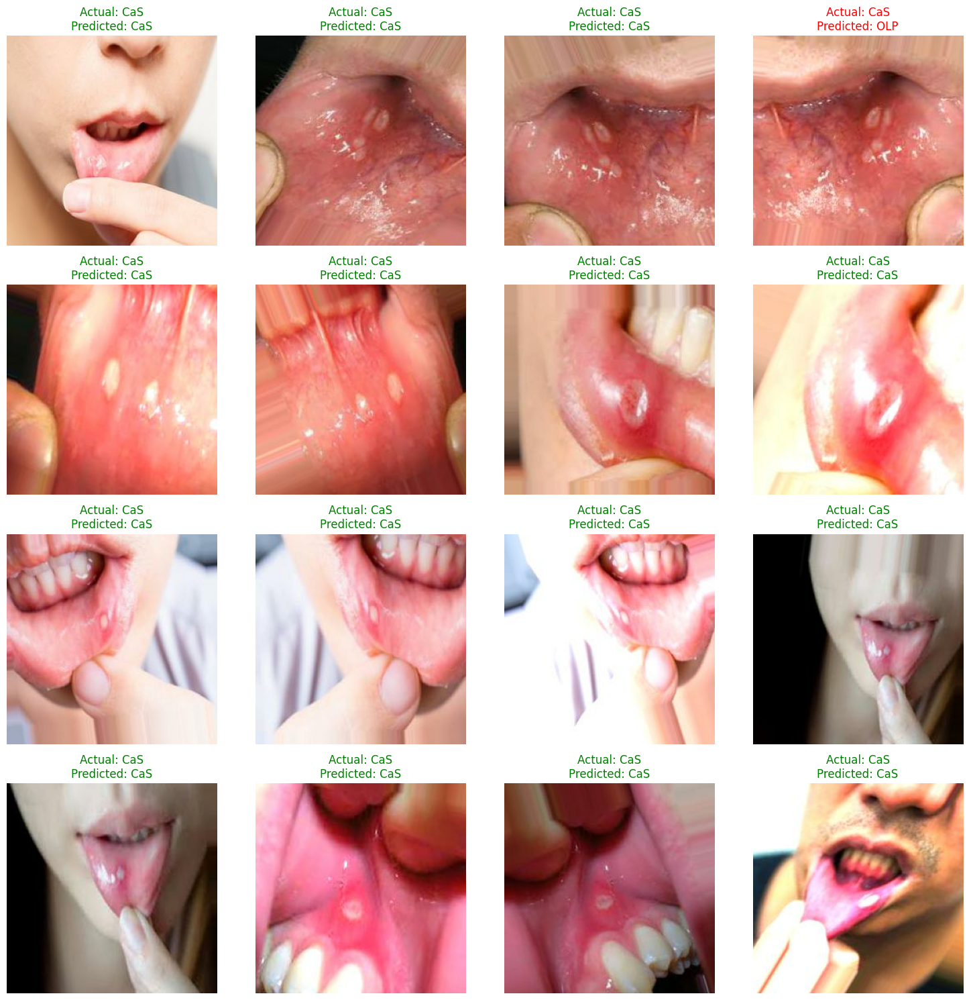

In [ ]:
# Get the class names from one of the datasets (they are all the same)
class_names = train_data.class_names

# Call the function to visualize predictions on the test set
visualize_predictions(teeth_Tranfer_ResNet50, test_data, class_names, num_images=16)

33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step
Classification Report:
              precision    recall  f1-score   support

         CaS       0.96      0.94      0.95       160
         CoS       0.97      1.00      0.98       149
         Gum       0.87      0.88      0.88       120
          MC       0.84      0.87      0.86       180
          OC       0.89      0.86      0.87       108
         OLP       0.88      0.91      0.89       180
          OT       0.93      0.84      0.88       131

    accuracy                           0.90      1028
   macro avg       0.90      0.90      0.90      1028
weighted avg       0.90      0.90      0.90      1028


Confusion Matrix:
[[150   1   2   4   0   3   0]
 [  0 149   0   0   0   0   0]
 [  3   0 106   8   1   2   0]
 [  1   1   7 157   6   7   1]
 [  0   0   1   8  93   5   1]
 [  1   0   3   4   3 163   6]
 [  2   3   3   5   2   6 110]]


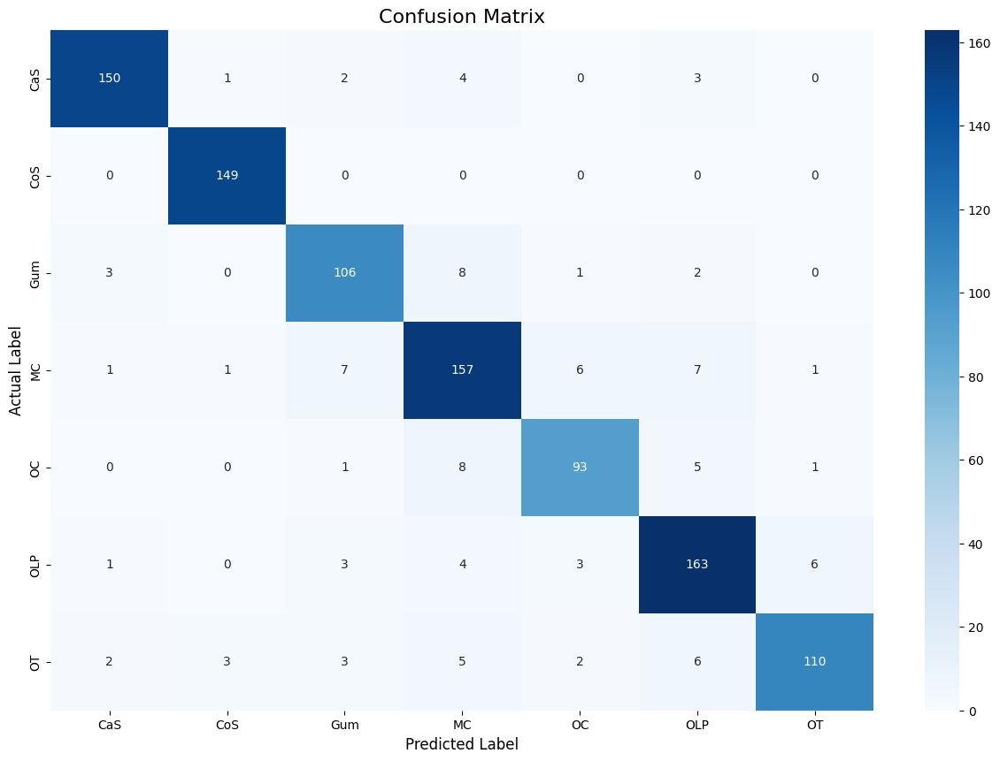

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the ground truth labels from the test dataset
true_labels = []
for images, labels in test_data:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(true_labels)

# Get the model's predictions on the test dataset
predictions = teeth_Tranfer_ResNet50.predict(test_data)
y_pred = np.argmax(predictions, axis=1)

# Get the class names
class_names = test_data.class_names

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
print(cm)

# Confusion Matrix Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

## **ResNet50 FineTune**

In [ ]:
resnet_base_model.trainable = True

In [ ]:
from tensorflow.keras.applications import ResNet50
import tensorflow as tf

# Load the ResNet50 model with pre-trained ImageNet weights, excluding the top classification layer
# Ensure the input shape matches your dataset images
resnet_base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
)

# Define the input layer for the new model
inputs = tf.keras.Input(shape=(256, 256, 3))

# Add the data augmentation layers (if you want to use them with this model)
# If you are not using data augmentation here, you can remove this line
x = data_augmentation(inputs)


# Pass the augmented input through the frozen pre-trained base model
x = resnet_base_model(x, training=False)

# Add a pooling layer
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Add a dropout layer
x = tf.keras.layers.Dropout(0.5)(x)

# Add the final dense output layer for classification
output = tf.keras.layers.Dense(units=7, activation='softmax')(x)

# Build the new transfer learning model
teeth_Tranfer_ResNet50_FineTune = tf.keras.Model(inputs, output)



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
len(resnet_base_model.layers)

175

In [ ]:
for layer in resnet_base_model.layers[:125]:

  layer.trainable = False

In [ ]:
# Compile the model
teeth_Tranfer_ResNet50_FineTune.compile(optimizer='adam',
                               loss='categorical_crossentropy',
                               metrics=['accuracy'])

# Print the model summary
teeth_Tranfer_ResNet50_FineTune.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 7)              │        14,343 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,602,055 (90.03 MB)

 Trainable params: 16,964,871 (64.72 MB)

 Non-trainable params: 6,637,184 (25.32 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Stop training when validation loss stops improving
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=10,
                               restore_best_weights=True)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=3,
                              min_lr=1e-6)

# Train the model
history_5 = teeth_Tranfer_ResNet50_FineTune.fit(train_data,
                        validation_data=val_data,
                        epochs=100,
                        callbacks=[early_stopping, reduce_lr])

Epoch 1/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 865s 9s/step - accuracy: 0.5376 - loss: 1.4159 - val_accuracy: 0.2977 - val_loss: 13.0655 - learning_rate: 0.0010
Epoch 2/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 46s 318ms/step - accuracy: 0.8296 - loss: 0.5339 - val_accuracy: 0.7665 - val_loss: 1.3756 - learning_rate: 0.0010
Epoch 3/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 30s 310ms/step - accuracy: 0.8990 - loss: 0.3107 - val_accuracy: 0.7860 - val_loss: 1.1838 - learning_rate: 0.0010
Epoch 4/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 30s 313ms/step - accuracy: 0.9203 - loss: 0.2397 - val_accuracy: 0.8940 - val_loss: 0.3589 - learning_rate: 0.0010
Epoch 5/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 46s 368ms/step - accuracy: 0.9292 - loss: 0.2174 - val_accuracy: 0.9446 - val_loss: 0.1803 - learning_rate: 0.0010
Epoch 6/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 36s 314ms/step - accuracy: 0.9426 - loss: 0.1678 - val_accuracy: 0.9514 - val_loss: 0.2043 - learning_rate: 0.0010
Epoch 7/100
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 314ms/step - accuracy: 0.9584 - lo

In [ ]:
model_history = history_5.history

acc = model_history['accuracy']
val_acc = model_history['val_accuracy']
loss = model_history['loss']
val_loss = model_history['val_loss']

epochs = history_5.epoch

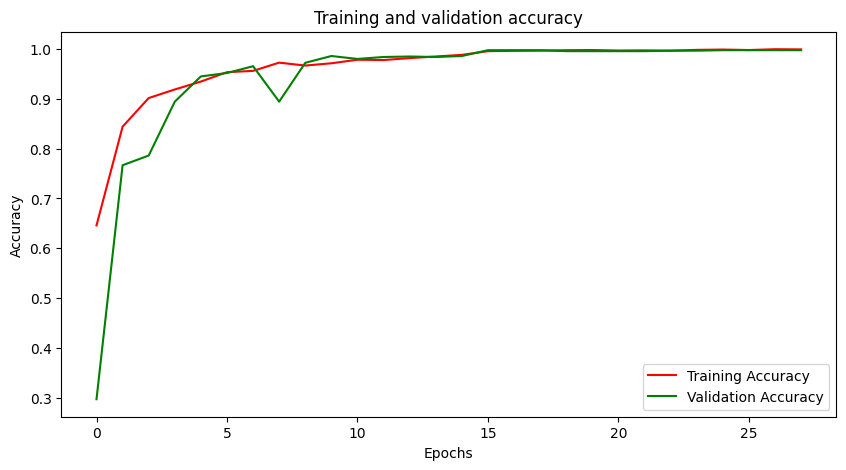

<Figure size 640x480 with 0 Axes>

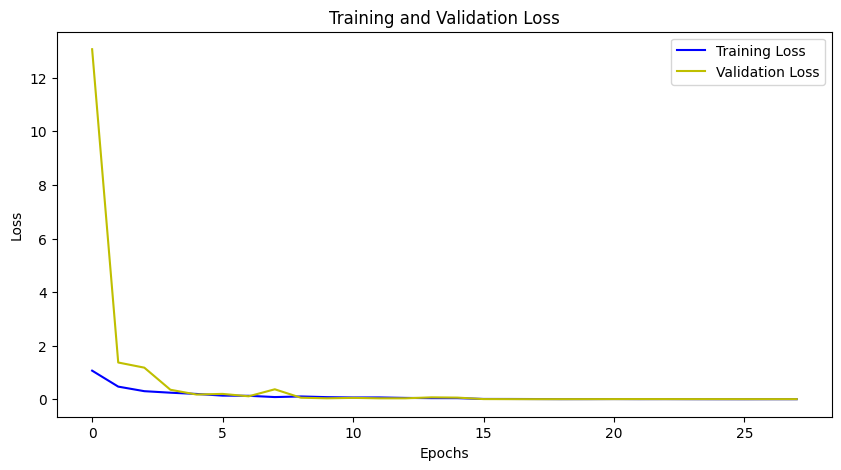

In [ ]:
plot_acc_loss(acc, val_acc, loss, val_loss, epochs)

In [ ]:
print("Evaluating model on the test dataset...")
test_loss, test_accuracy = teeth_Tranfer_ResNet50_FineTune.evaluate(test_data)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

Evaluating model on the test dataset...
33/33 ━━━━━━━━━━━━━━━━━━━━ 230s 7s/step - accuracy: 0.9972 - loss: 0.0065
Test Loss: 0.0121
Test Accuracy: 99.51%


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


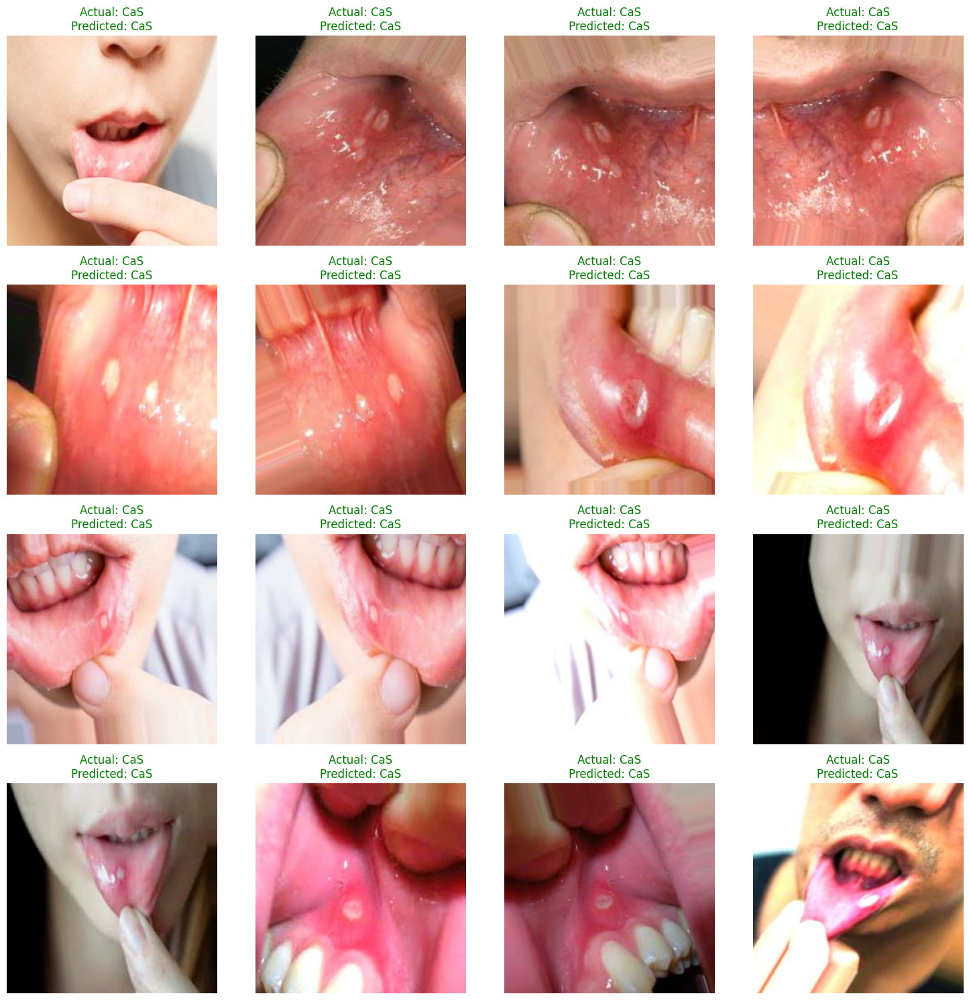

In [ ]:
# Get the class names from one of the datasets (they are all the same)
class_names = train_data.class_names

# Call the function to visualize predictions on the test set
visualize_predictions(teeth_Tranfer_ResNet50_FineTune, test_data, class_names, num_images=16)

33/33 ━━━━━━━━━━━━━━━━━━━━ 9s 215ms/step
Classification Report:
              precision    recall  f1-score   support

         CaS       0.99      1.00      1.00       160
         CoS       1.00      1.00      1.00       149
         Gum       1.00      0.99      1.00       120
          MC       0.99      0.99      0.99       180
          OC       0.98      0.99      0.99       108
         OLP       1.00      0.99      1.00       180
          OT       1.00      1.00      1.00       131

    accuracy                           1.00      1028
   macro avg       0.99      1.00      0.99      1028
weighted avg       1.00      1.00      1.00      1028


Confusion Matrix:
[[160   0   0   0   0   0   0]
 [  0 149   0   0   0   0   0]
 [  0   0 119   1   0   0   0]
 [  0   0   0 178   2   0   0]
 [  0   0   0   1 107   0   0]
 [  1   0   0   0   0 179   0]
 [  0   0   0   0   0   0 131]]


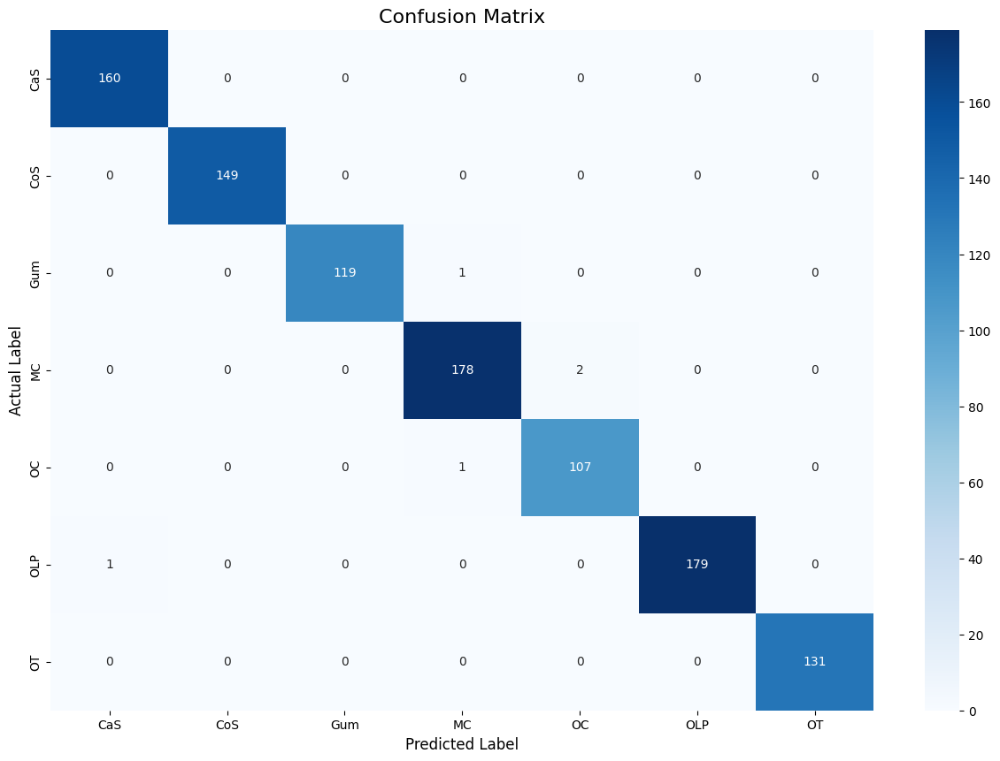

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get the ground truth labels from the test dataset
true_labels = []
for images, labels in test_data:
    true_labels.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(true_labels)

# Get the model's predictions on the test dataset
predictions = teeth_Tranfer_ResNet50_FineTune.predict(test_data)
y_pred = np.argmax(predictions, axis=1)

# Get the class names
class_names = test_data.class_names

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion Matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(y_true, y_pred)
print(cm)

# Confusion Matrix Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.title('Confusion Matrix', fontsize=16)
plt.ylabel('Actual Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

In [ ]:
# Specify the path to save the model in your Google Drive
model_save_path = '/content/drive/MyDrive/Cellula Technology/Teeth Classification/teeth_classification_model_with_FineTune.keras'

# Save the model
teeth_Tranfer_ResNet50_FineTune.save(model_save_path)

print(f"Model saved to: {model_save_path}")

Model saved to: /content/drive/MyDrive/Cellula Technology/Teeth Classification/teeth_classification_model_with_FineTune.keras
